#  <center> Analyzing Ground Surface Air Pollution: Insights from a Machine Learning  Approach

####  <center> By Jada Macharie

### <center> Question: Using KNN and RF, can we predict whether MODIS AOD can be used to determine surface air pollution or not?


In [76]:
import pandas as pd
import numpy as np
import requests
import os

import json
import kaleido
from glob import glob
import fiona
import rasterio as rio
import rioxarray as rxr
import xarray as xr

#Plot Data
import geopandas as gpd
from osgeo import gdal
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from rasterio.plot import show
from shapely.geometry import mapping
import earthpy.plot as ep
import plotly.io as pio
import plotly.graph_objects as go


import warnings
warnings.filterwarnings("ignore")

#Algorithm Functions
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import classification_report

#Import KNN Algorithm Functions
from sklearn.neighbors import KNeighborsClassifier

#Import SVR Algorithm Functions
# from sklearn.svm import SVR

#Import RF Algorithm Functions
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

#Test How Good The Model is
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score

In [77]:
os.getcwd()
os.chdir('/Users/jadamacharie/Downloads/71300FinalProject')
os.getcwd()

'/Users/jadamacharie/Downloads/71300FinalProject'

# Import Data

## -Meteorological Data

In [3]:
#Upload data
Wind2013 = pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/daily_WIND_2013.csv')
Temp2013 = pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/daily_TEMP_2013.csv')
RH2013 = pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/daily_RH_DP_2013.csv')
Press2013 = pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/daily_PRESS_2013.csv')
Pollut2013= pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/daily_PM_2013.csv')

Wind2013.head()
# Temp2013.head()
# RH2013.head()
# Press2013.head()
Pollut2013.head()

,State Code,County Code,Site Num,Parameter Code,POC,Latitude,Longitude,Datum,Parameter Name,Sample Duration,...,AQI,Method Code,Method Name,Local Site Name,Address,State Name,County Name,City Name,CBSA Name,Date of Last Change
0,1,3,10,88101,1,30.497478,-87.880258,NAD83,PM2.5 - Local Conditions,24 HOUR,...,30.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2021-11-08
1,1,3,10,88101,1,30.497478,-87.880258,NAD83,PM2.5 - Local Conditions,24 HOUR,...,32.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2021-11-08
2,1,3,10,88101,1,30.497478,-87.880258,NAD83,PM2.5 - Local Conditions,24 HOUR,...,36.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2021-11-08
3,1,3,10,88101,1,30.497478,-87.880258,NAD83,PM2.5 - Local Conditions,24 HOUR,...,29.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2021-11-08
4,1,3,10,88101,1,30.497478,-87.880258,NAD83,PM2.5 - Local Conditions,24 HOUR,...,30.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,"FAIRHOPE, Alabama","FAIRHOPE HIGH SCHOOL, 1 PIRATE DRIVE, FAIRHOPE...",Alabama,Baldwin,Fairhope,"Daphne-Fairhope-Foley, AL",2021-11-08


In [4]:
#Filter Meterological data for McMillian Reservoir
McMillian_Wind = Wind2013[Wind2013['Local Site Name'].isin(['MCMILLAN  NCore-PAMS'])]
McMillian_Temp = Temp2013[Temp2013['Local Site Name'].isin(['MCMILLAN  NCore-PAMS'])]
McMillian_RH = RH2013[RH2013['Local Site Name'].isin(['MCMILLAN  NCore-PAMS'])]
McMillian_Press = Press2013[Press2013['Local Site Name'].isin(['MCMILLAN  NCore-PAMS'])]
McMillian_PM2_5 = Pollut2013[Pollut2013['Local Site Name'].isin(['MCMILLAN  NCore-PAMS'])]

# McMillian_Wind.head()
McMillian_Temp.head()
# McMillian_RH.head()
# McMillian_Press.head()
# McMillian_PM2_5.head()

,State Code,County Code,Site Num,Parameter Code,POC,Latitude,Longitude,Datum,Parameter Name,Sample Duration,...,AQI,Method Code,Method Name,Local Site Name,Address,State Name,County Name,City Name,CBSA Name,Date of Last Change
73018,11,1,43,62101,2,38.921847,-77.013178,WGS84,Outdoor Temperature,1 HOUR,...,NaN,40,INSTRUMENTAL - ELECTRONIC OR MACHINE AVG.,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2014-02-11
73019,11,1,43,62101,2,38.921847,-77.013178,WGS84,Outdoor Temperature,1 HOUR,...,NaN,40,INSTRUMENTAL - ELECTRONIC OR MACHINE AVG.,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2014-02-11
73020,11,1,43,62101,2,38.921847,-77.013178,WGS84,Outdoor Temperature,1 HOUR,...,NaN,40,INSTRUMENTAL - ELECTRONIC OR MACHINE AVG.,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2014-02-11
73021,11,1,43,62101,2,38.921847,-77.013178,WGS84,Outdoor Temperature,1 HOUR,...,NaN,40,INSTRUMENTAL - ELECTRONIC OR MACHINE AVG.,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2014-02-11
73022,11,1,43,62101,2,38.921847,-77.013178,WGS84,Outdoor Temperature,1 HOUR,...,NaN,40,INSTRUMENTAL - ELECTRONIC OR MACHINE AVG.,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2014-02-11


In [5]:
#Drop Unused Columns
Wind = McMillian_Wind.drop(['State Code', 'County Code','Site Num','Parameter Code','POC','Datum','State Name', 'County Name','City Name','CBSA Name','Address','Event Type','Pollutant Standard'], axis=1)
Temp = McMillian_Temp.drop(['State Code', 'County Code','Site Num','Parameter Code','POC','Datum','State Name', 'County Name','City Name','CBSA Name','Address','Event Type','Pollutant Standard'], axis=1)
RH = McMillian_RH.drop(['State Code', 'County Code','Site Num','Parameter Code','POC','Datum','State Name', 'County Name','City Name','CBSA Name','Address','Event Type','Pollutant Standard'], axis=1)
Press = McMillian_Press.drop(['State Code', 'County Code','Site Num','Parameter Code','POC','Datum','State Name', 'County Name','City Name','CBSA Name','Address','Event Type','Pollutant Standard'], axis=1)
PM2_5 = McMillian_PM2_5.drop(['State Code', 'County Code','Site Num','Parameter Code','POC','Datum','State Name', 'County Name','City Name','CBSA Name','Address','Event Type','Pollutant Standard'], axis=1)

# Wind.head()
# Temp.head()
# RH.head()
# Press.head()
# PM2_5.head()

In [6]:
#Import Ward 1 shapefile
Ward1_shapefile = gpd.read_file("Ward1")
Ward1_shapefile

,WARD,NAME,REP_NAME,WEB_URL,REP_PHONE,REP_EMAIL,REP_OFFICE,WARD_ID,LABEL,STUSAB,...,P0050010,OBJECTID,GLOBALID,CREATED_US,CREATED_DA,LAST_EDITE,LAST_EDI_1,SHAPEAREA,SHAPELEN,geometry
0,1,Ward 1,Brianne Nadeau,https://dccouncil.us/council/brianne-nadeau,(202) 724-8181,bnadeau@dccouncil.us,"1350 Pennsylvania Ave, Suite 102, NW 20004",1,Ward 1,DC,...,752,5,{C3C6E2E7-E68D-49B2-970C-D60675EA7B4B},NaN,NaN,NaN,NaN,0,0,"POLYGON ((-77.03523 38.93743, -77.03480 38.937..."


## - Satellite Data



In [7]:
MODIS_AOD = glob("/Users/jadamacharie/Downloads/71300FinalProject/*tif")
MODIS_AOD

['/Users/jadamacharie/Downloads/71300FinalProject/AOD Image 2013.tif',
 '/Users/jadamacharie/Downloads/71300FinalProject/AODRaster.tif']

In [8]:
fn = '/Users/jadamacharie/Downloads/71300FinalProject/AOD Image 2013.tif'
AOD_image = rio.open(fn,"r")

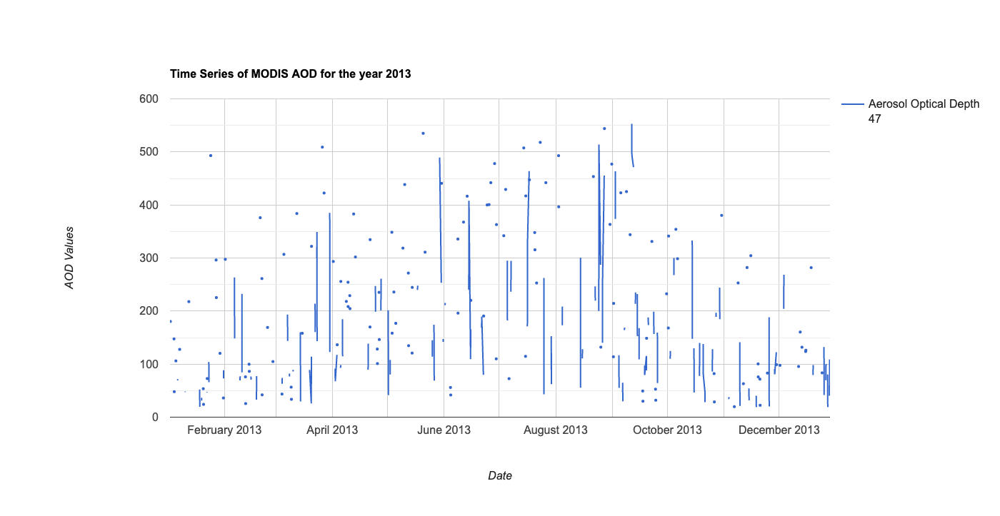

In [9]:
from IPython import display 
display.Image("ee-chart.png",width = 1000, height = 600)

In [10]:
AOD2013 = pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/AQI_bucket.csv')
AOD2013

,Arithmetic Mean,1st Max Value,AQI,AQI_Bucket,1st Max Hour,Observation Percent,Latitude,Longitude,Aerosol Optical Depth
0,1007.183333,1007.900000,0.0,NaN,0.000000,100.000000,38.921847,-77.013178,NaN
1,41.875000,44.000000,0.0,NaN,14.000000,100.000000,38.921847,-77.013178,NaN
2,8.587500,10.150000,34.0,Good,6.000000,100.000000,38.921847,-77.013178,NaN
3,48.262500,58.500000,0.0,NaN,23.000000,100.000000,38.921847,-77.013178,NaN
4,263.208333,309.000000,0.0,NaN,23.000000,100.000000,38.921847,-77.013178,180.422
...,...,...,...,...,...,...,...,...,...
2061,35.795833,43.500000,0.0,NaN,14.000000,100.000000,38.921847,-77.013178,NaN
2062,7.113043,8.533333,28.5,NaN,6.666667,98.666667,38.921847,-77.013178,NaN
2063,46.162500,57.300000,0.0,NaN,11.000000,100.000000,38.921847,-77.013178,NaN
2064,210.666667,336.000000,0.0,NaN,20.000000,100.000000,38.921847,-77.013178,NaN


In [11]:
# #Replace NaN values with 0
AOD2013.fillna(0,inplace=True)
AOD2013

,Arithmetic Mean,1st Max Value,AQI,AQI_Bucket,1st Max Hour,Observation Percent,Latitude,Longitude,Aerosol Optical Depth
0,1007.183333,1007.900000,0.0,0,0.000000,100.000000,38.921847,-77.013178,0.000
1,41.875000,44.000000,0.0,0,14.000000,100.000000,38.921847,-77.013178,0.000
2,8.587500,10.150000,34.0,Good,6.000000,100.000000,38.921847,-77.013178,0.000
3,48.262500,58.500000,0.0,0,23.000000,100.000000,38.921847,-77.013178,0.000
4,263.208333,309.000000,0.0,0,23.000000,100.000000,38.921847,-77.013178,180.422
...,...,...,...,...,...,...,...,...,...
2061,35.795833,43.500000,0.0,0,14.000000,100.000000,38.921847,-77.013178,0.000
2062,7.113043,8.533333,28.5,0,6.666667,98.666667,38.921847,-77.013178,0.000
2063,46.162500,57.300000,0.0,0,11.000000,100.000000,38.921847,-77.013178,0.000
2064,210.666667,336.000000,0.0,0,20.000000,100.000000,38.921847,-77.013178,0.000



## - Merge Data

In [12]:
# file_list = ['daily_PM_2013.csv', 'daily_TEMP_2013.csv', 'daily_RH_DP_2013.csv', 'daily_PRESS_2013.csv','daily_WIND_2013.csv']
# df = pd.DataFrame()
# for file in file_list:
#     x = pd.read_csv(file, header=0)
#     df = pd.concat([df, x], axis=1)
# df.to_csv('/Users/jadamacharie/Downloads/71300FinalProject/Train.csv')

In [13]:

# extension = 'csv'
# all_filenames = [i for i in glob.glob('*.{}'.format(extension))]
# combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])
# combined_csv.info()
# #export to csv
# # combined_csv.to_csv( "combined_csv.csv", index=False, encoding='utf-8-sig')

## - Import Exported Files

In [14]:
Com = pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/combined_csv.csv')
# Com

In [15]:
Traindata = Com[Com['Local Site Name'].isin(['MCMILLAN  NCore-PAMS'])]
Traindata.head()
# print(len(Traindata))

,State Code,County Code,Site Num,Parameter Code,POC,Latitude,Longitude,Datum,Parameter Name,Sample Duration,...,AQI,Method Code,Method Name,Local Site Name,Address,State Name,County Name,City Name,CBSA Name,Date of Last Change
76793,11,1,43,88101,1,38.921847,-77.013178,WGS84,PM2.5 - Local Conditions,24 HOUR,...,31.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2021-11-08
76794,11,1,43,88101,1,38.921847,-77.013178,WGS84,PM2.5 - Local Conditions,24 HOUR,...,46.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2021-11-08
76795,11,1,43,88101,1,38.921847,-77.013178,WGS84,PM2.5 - Local Conditions,24 HOUR,...,56.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2021-11-08
76796,11,1,43,88101,1,38.921847,-77.013178,WGS84,PM2.5 - Local Conditions,24 HOUR,...,37.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2021-11-08
76797,11,1,43,88101,1,38.921847,-77.013178,WGS84,PM2.5 - Local Conditions,24 HOUR,...,35.0,118.0,R & P Model 2025 PM2.5 Sequential w/WINS - GRA...,MCMILLAN NCore-PAMS,"2500 1ST STREET, N.W. WASHINGTON DC",District Of Columbia,District of Columbia,Washington,"Washington-Arlington-Alexandria, DC-VA-MD-WV",2021-11-08


In [16]:
data = Traindata.drop(['Method Name','Units of Measure','Date of Last Change','Local Site Name','Parameter Code','State Code','County Code','Site Num','Pollutant Standard','POC','Datum','Sample Duration','Event Type','Observation Count','Method Code','Address','State Name','County Name','City Name','CBSA Name'], axis=1)
data

,Latitude,Longitude,Parameter Name,Date Local,Observation Percent,Arithmetic Mean,1st Max Value,1st Max Hour,AQI
76793,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-01,100.0,7.500000,7.5,0,31.0
76794,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-02,100.0,11.100000,11.1,0,46.0
76795,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-03,100.0,14.500000,14.5,11,56.0
76796,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-04,100.0,8.800000,8.8,11,37.0
76797,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-05,100.0,8.300000,8.3,11,35.0
...,...,...,...,...,...,...,...,...,...
1247768,38.921847,-77.013178,Barometric pressure,2013-12-27,100.0,1020.395833,1022.6,9,NaN
1247769,38.921847,-77.013178,Barometric pressure,2013-12-28,100.0,1016.191667,1018.6,0,NaN
1247770,38.921847,-77.013178,Barometric pressure,2013-12-29,100.0,1002.175000,1011.9,0,NaN
1247771,38.921847,-77.013178,Barometric pressure,2013-12-30,100.0,1009.125000,1014.6,20,NaN


In [17]:
Training = data.rename(columns={"Date Local": "Date"})
Training

,Latitude,Longitude,Parameter Name,Date,Observation Percent,Arithmetic Mean,1st Max Value,1st Max Hour,AQI
76793,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-01,100.0,7.500000,7.5,0,31.0
76794,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-02,100.0,11.100000,11.1,0,46.0
76795,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-03,100.0,14.500000,14.5,11,56.0
76796,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-04,100.0,8.800000,8.8,11,37.0
76797,38.921847,-77.013178,PM2.5 - Local Conditions,2013-01-05,100.0,8.300000,8.3,11,35.0
...,...,...,...,...,...,...,...,...,...
1247768,38.921847,-77.013178,Barometric pressure,2013-12-27,100.0,1020.395833,1022.6,9,NaN
1247769,38.921847,-77.013178,Barometric pressure,2013-12-28,100.0,1016.191667,1018.6,0,NaN
1247770,38.921847,-77.013178,Barometric pressure,2013-12-29,100.0,1002.175000,1011.9,0,NaN
1247771,38.921847,-77.013178,Barometric pressure,2013-12-30,100.0,1009.125000,1014.6,20,NaN


## Calculate AQI Bucket (Good, Poor,... Air)

In [18]:
# Training['AQI_Bucket'] = 'NaN'
# Training

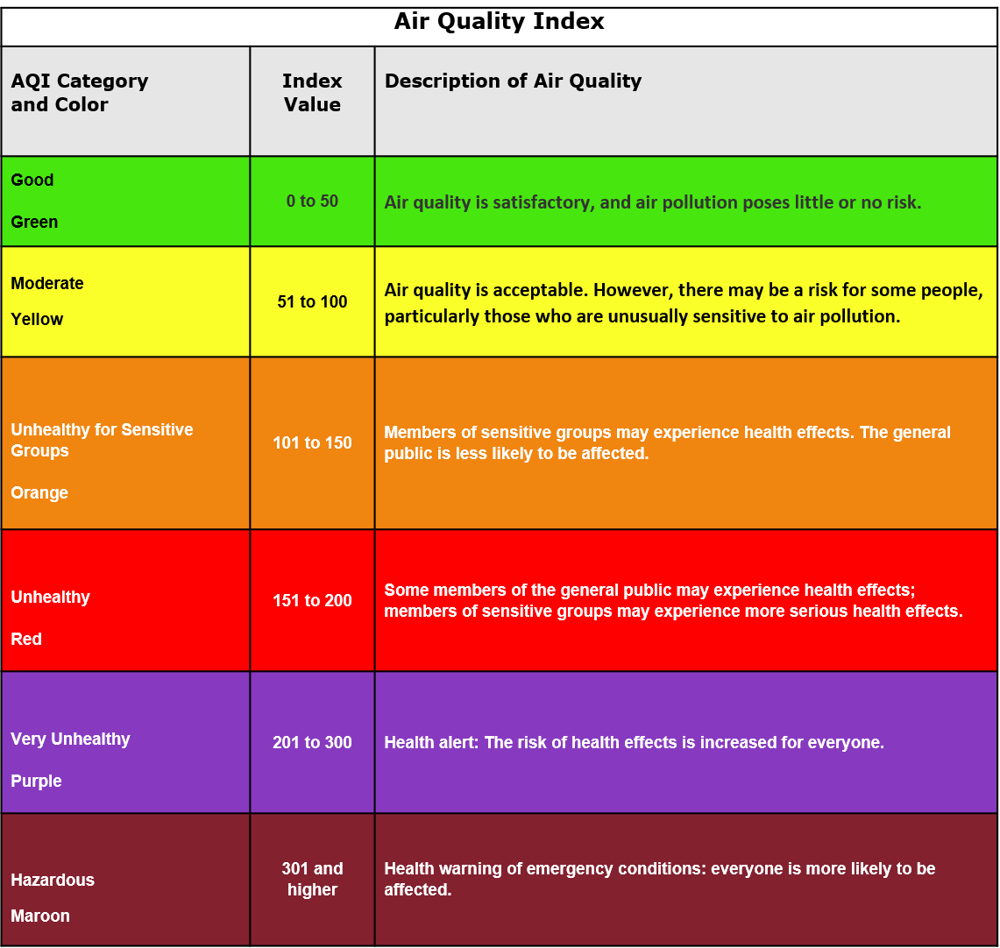

In [19]:
from IPython import display 
display.Image("aqitableforcourse.png",width = 400, height = 200)

In [20]:
# x['AQI_Bucket'] = ''
# x
# x.to_csv('/Users/jadamacharie/Downloads/71300FinalProject/X.csv')

In [21]:
AQI_Bucket = pd.read_csv('/Users/jadamacharie/Downloads/71300FinalProject/AQI_bucket.csv')
AQI_Bucket

,Arithmetic Mean,1st Max Value,AQI,AQI_Bucket,1st Max Hour,Observation Percent,Latitude,Longitude,Aerosol Optical Depth
0,1007.183333,1007.900000,0.0,NaN,0.000000,100.000000,38.921847,-77.013178,NaN
1,41.875000,44.000000,0.0,NaN,14.000000,100.000000,38.921847,-77.013178,NaN
2,8.587500,10.150000,34.0,Good,6.000000,100.000000,38.921847,-77.013178,NaN
3,48.262500,58.500000,0.0,NaN,23.000000,100.000000,38.921847,-77.013178,NaN
4,263.208333,309.000000,0.0,NaN,23.000000,100.000000,38.921847,-77.013178,180.422
...,...,...,...,...,...,...,...,...,...
2061,35.795833,43.500000,0.0,NaN,14.000000,100.000000,38.921847,-77.013178,NaN
2062,7.113043,8.533333,28.5,NaN,6.666667,98.666667,38.921847,-77.013178,NaN
2063,46.162500,57.300000,0.0,NaN,11.000000,100.000000,38.921847,-77.013178,NaN
2064,210.666667,336.000000,0.0,NaN,20.000000,100.000000,38.921847,-77.013178,NaN


In [22]:
def get_AQI_bucket(x):
    if x <= 50:
        return "Good"
    elif x > 50 and x <= 100:
        return "Satisfactory"
    elif x > 100 and x <= 200:
        return "Moderate"
    elif x > 200 and x <= 300:
        return "Poor"
    elif x > 300 and x <= 400:
        return "Very Poor"
    elif x > 400:
        return "Severe"
    else:
        return '0'
    
AQI_Bucket["AQI_Bucket"] = AQI_Bucket["AQI_Bucket"].fillna(AQI_Bucket["AQI"].apply(lambda x: get_AQI_bucket(x)))
AQI_Bucket

,Arithmetic Mean,1st Max Value,AQI,AQI_Bucket,1st Max Hour,Observation Percent,Latitude,Longitude,Aerosol Optical Depth
0,1007.183333,1007.900000,0.0,Good,0.000000,100.000000,38.921847,-77.013178,NaN
1,41.875000,44.000000,0.0,Good,14.000000,100.000000,38.921847,-77.013178,NaN
2,8.587500,10.150000,34.0,Good,6.000000,100.000000,38.921847,-77.013178,NaN
3,48.262500,58.500000,0.0,Good,23.000000,100.000000,38.921847,-77.013178,NaN
4,263.208333,309.000000,0.0,Good,23.000000,100.000000,38.921847,-77.013178,180.422
...,...,...,...,...,...,...,...,...,...
2061,35.795833,43.500000,0.0,Good,14.000000,100.000000,38.921847,-77.013178,NaN
2062,7.113043,8.533333,28.5,Good,6.666667,98.666667,38.921847,-77.013178,NaN
2063,46.162500,57.300000,0.0,Good,11.000000,100.000000,38.921847,-77.013178,NaN
2064,210.666667,336.000000,0.0,Good,20.000000,100.000000,38.921847,-77.013178,NaN


<Axes: >

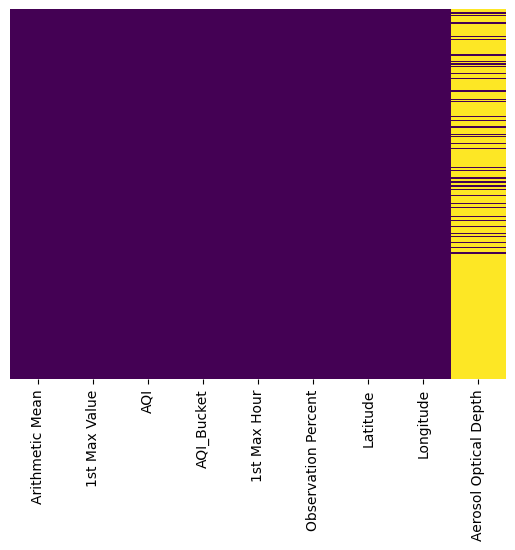

In [23]:
sns.heatmap(AQI_Bucket.isnull(),yticklabels=False, cbar=False,cmap= "viridis")

In [24]:
Train_v2 = Training.groupby(['Date','Parameter Name'])['Arithmetic Mean','1st Max Value','AQI','1st Max Hour','Observation Percent','Latitude','Longitude'].mean()
Train_v2

Train_v3 = pd.DataFrame(Train_v2)
Train_v3


Arithmetic Mean  1st Max Value   AQI  \
Date       Parameter Name                                                     
2013-01-01 Barometric pressure             1007.183333    1007.900000   NaN   
           Outdoor Temperature               41.875000      44.000000   NaN   
           PM2.5 - Local Conditions           8.587500      10.150000  34.0   
           Relative Humidity                 48.262500      58.500000   NaN   
           Wind Direction - Resultant       263.208333     309.000000   NaN   
...                                                ...            ...   ...   
2013-12-31 Outdoor Temperature               35.795833      43.500000   NaN   
           PM2.5 - Local Conditions           7.113043       8.533333  28.5   
           Relative Humidity                 46.162500      57.300000   NaN   
           Wind Direction - Resultant       210.666667     336.000000   NaN   
           Wind Speed - Resultant             9.666667      17.900000   NaN   

                                       1st Max Hour  Observation Percent  \
Date       Parameter Name                                                  
2013-01-01 Barometric pressure             0.000000           100.000000   
           Outdoor Temperature            14.000000           100.000000   
           PM2.5 - Local Conditions        6.000000           100.000000   
           Relative Humidity              23.000000           100.000000   
           Wind Direction - Resultant     23.000000           100.000000   
...                                             ...                  ...   
2013-12-31 Outdoor Temperature            14.000000           100.000000   
           PM2.5 - Local Conditions        6.666667            98.666667   
           Relative Humidity              11.000000           100.000000   
           Wind Direction - Resultant     20.000000           100.000000   
           Wind Speed - Resultant         15.000000           100.000000   

                                        Latitude  Longitude  
Date       Parameter Name                                    
2013-01-01 Barometric pressure         38.921847 -77.013178  
           Outdoor Temperature         38.921847 -77.013178  
           PM2.5 - Local Conditions    38.921847 -77.013178  
           Relative Humidity           38.921847 -77.013178  
           Wind Direction - Resultant  38.921847 -77.013178  
...                                          ...        ...  
2013-12-31 Outdoor Temperature         38.921847 -77.013178  
           PM2.5 - Local Conditions    38.921847 -77.013178  
           Relative Humidity           38.921847 -77.013178  
           Wind Direction - Resultant  38.921847 -77.013178  
           Wind Speed - Resultant      38.921847 -77.013178  

[2066 rows x 7 columns]

In [25]:
AQI_Bucket.columns

Index(['Arithmetic Mean', '1st Max Value', 'AQI', 'AQI_Bucket', '1st Max Hour',
       'Observation Percent', 'Latitude', 'Longitude',
       'Aerosol Optical Depth'],
      dtype='object')

In [32]:
# Traindata_v2 = j.drop_duplicates(subset=["Date"], keep=False)
# Traindata_v2

# Traindata_v2 = j.apply(lambda x: x.astype(str).str.lower()).drop_duplicates(subset=['Date'], keep='first')
# Traindata_v2

In [29]:
#Check to see if there are no NaN values in dataset
AQI_Bucket.isnull().sum()

Arithmetic Mean             0
1st Max Value               0
AQI                         0
AQI_Bucket                  0
1st Max Hour                0
Observation Percent         0
Latitude                    0
Longitude                   0
Aerosol Optical Depth    1742
dtype: int64

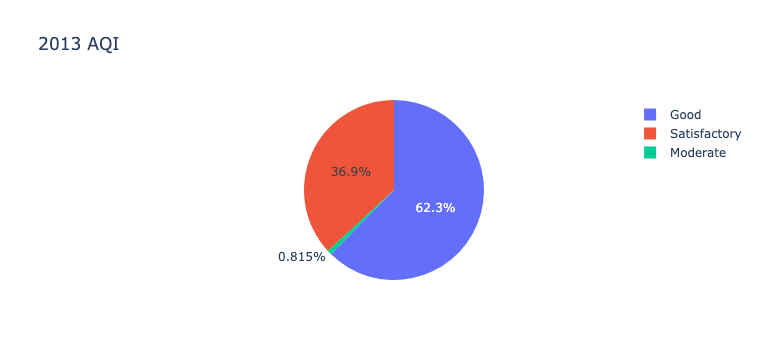

In [33]:
fig = px.pie(AQI_Bucket, values='AQI', names='AQI_Bucket', title= '2013 AQI ')
fig.show()

## Google Earth Engine

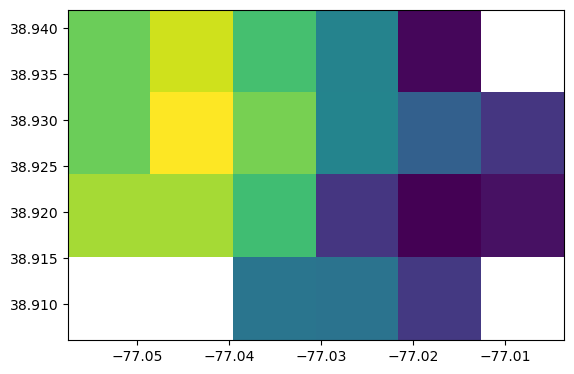

<Axes: >

In [721]:
show(AOD_image)

In [34]:
ds = gdal.Open("AOD Image 2013.tif")
myarray = np.array(ds.GetRasterBand(1).ReadAsArray())
myarray.shape
myarray.size

24

In [723]:
# pio.write_image(ds, file = 'AOD_pixels.png', engine='orca')
# pio.write_image(fig2, file = 'Scatter CensusArea.png', format = 'png')
# pio.write_image(fig3, file = 'Smallest_Counties.png', format = 'png')
# pio.write_image(fig4, file = 'Biggest_Counties.png', format = 'png')
# pio.write_html(fig2, file = 'Scatter CensusArea.html')

## - Explore Data

In [35]:
#Info of dataset
AQI_Bucket.info()

#How much data is missing in each column
AQI_Bucket.isnull().sum()

#Descriptive statistics
AQI_Bucket.describe()

#List of unique values
# AQI_Bucket.nunique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2066 entries, 0 to 2065
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Arithmetic Mean        2066 non-null   float64
 1   1st Max Value          2066 non-null   float64
 2   AQI                    2066 non-null   float64
 3   AQI_Bucket             2066 non-null   object 
 4   1st Max Hour           2066 non-null   float64
 5   Observation Percent    2066 non-null   float64
 6   Latitude               2066 non-null   float64
 7   Longitude              2066 non-null   float64
 8   Aerosol Optical Depth  324 non-null    float64
dtypes: float64(8), object(1)
memory usage: 145.4+ KB


,Arithmetic Mean,1st Max Value,AQI,1st Max Hour,Observation Percent,Latitude,Longitude,Aerosol Optical Depth
count,2066.000000,2066.000000,2066.000000,2066.000000,2066.000000,2.066000e+03,2.066000e+03,324.000000
mean,222.957686,241.631288,7.125282,10.084019,98.913036,3.892185e+01,-7.701318e+01,183.218120
std,360.972659,359.647741,16.717393,7.118513,6.581563,2.771788e-13,3.354574e-12,132.915937
min,0.000000,0.000000,0.000000,0.000000,4.000000,3.892185e+01,-7.701318e+01,19.000000
25%,10.556250,14.408333,0.000000,4.000000,100.000000,3.892185e+01,-7.701318e+01,79.481500
50%,56.800000,70.500000,0.000000,9.666667,100.000000,3.892185e+01,-7.701318e+01,144.429500
75%,187.583333,290.000000,0.000000,15.000000,100.000000,3.892185e+01,-7.701318e+01,261.139250
max,1028.291667,1031.900000,120.000000,23.000000,100.000000,3.892185e+01,-7.701318e+01,552.863000


In [36]:
# AQI_Bucket.fillna(0,inplace=True)
# AQI_Bucket

# Data Visualization

In [37]:
# with rio.open('/Users/jadamacharie/Downloads/71300FinalProject/mygeodata/MCD19A2.A2013365.h12v05.006.2018068203010Optical_Depth_047.tif') as bands123_plot:
#     show(bands123_plot.read([1,2,3]), title = 'Optical 47 Raster File (Bands:1,2,3)')
    
# with rio.open('/Users/jadamacharie/Downloads/71300FinalProject/mygeodata/MCD19A2.A2013361.h12v05.006.2018068203004Optical_Depth_047.tif') as bands1234_plot:
#     show(bands1234_plot.read([1,2,3,4]))

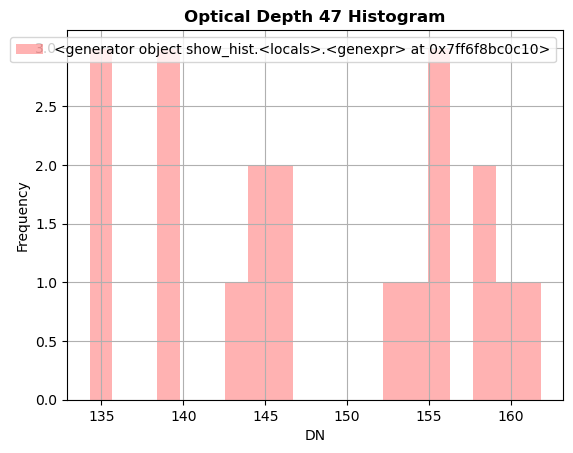

In [38]:
from rasterio.plot import show_hist

show_hist(AOD_image, bins=20, alpha=0.3,
      histtype='stepfilled', title='Optical Depth 47 Histogram')

In [ ]:
#Plot using Seaborn
g= sns.FacetGrid(Traindata_v2,row='Date',col='Arithmetic Mean',margin_titles = True, sharex = False)
g
# g.set_xticklabels(rotation=90)

# sns.relplot(data = Traindata)
# sns.lineplot(data=data)
# sns.lineplot(data=Train_v3, x= "Date", y= "1st Max Value", hue= "Parameter Name")

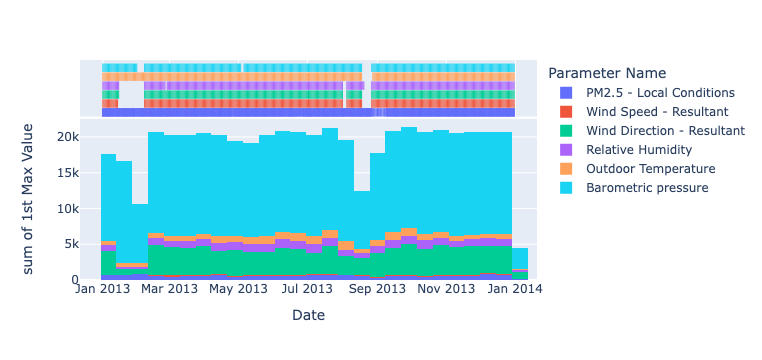

In [39]:
fig = px.histogram(Training,x="Date",y="1st Max Value", color="Parameter Name", marginal="rug", hover_data=Training.columns)
fig.show()

# pio.write_image(fig, file = 'HIST Traindata2013.png', format = 'png')


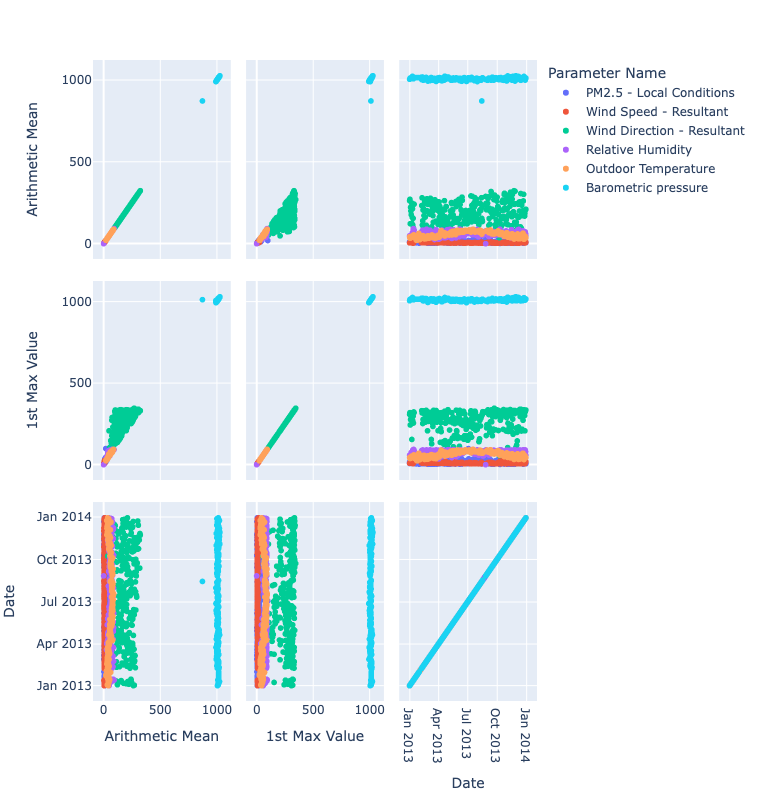

In [40]:
#Plots with Parameter comparisons
fig = px.scatter_matrix(Training, dimensions =['Arithmetic Mean','1st Max Value','Date'],color= "Parameter Name",width=1000, height=800)
fig.show()

# pio.write_image(fig, file = 'Scatter Traindata2013.png', format = 'png')

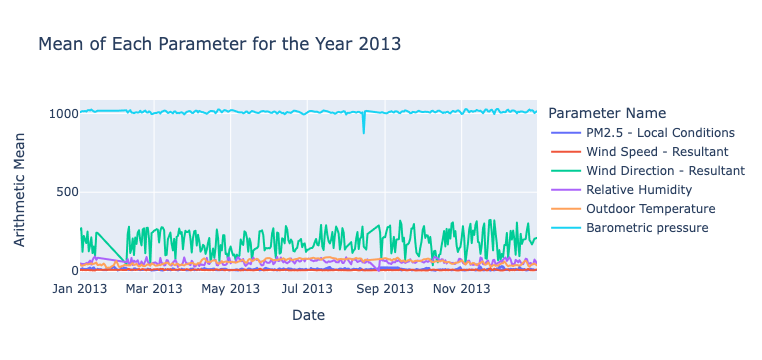

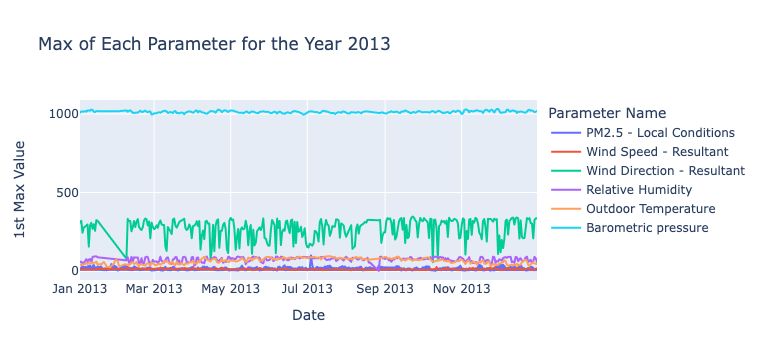

In [41]:
# Max_P2_5T = Traindata.iloc[0:2873].plot(y='1st Max Value')

fig = px.line(Training, x="Date", y="Arithmetic Mean",color='Parameter Name', title='Mean of Each Parameter for the Year 2013')
fig.show()

fig = px.line(Training, x="Date", y="1st Max Value",color='Parameter Name', title='Max of Each Parameter for the Year 2013')
fig.show()

# pio.write_image(fig, file = 'Line Traindata2013.png', format = 'png')

#PM2.5 = [1-1174]
#Wind = [1174-1836]
#RH = [1837-2169]
#Temp = [2170-2525]
#Press = [2526-2874

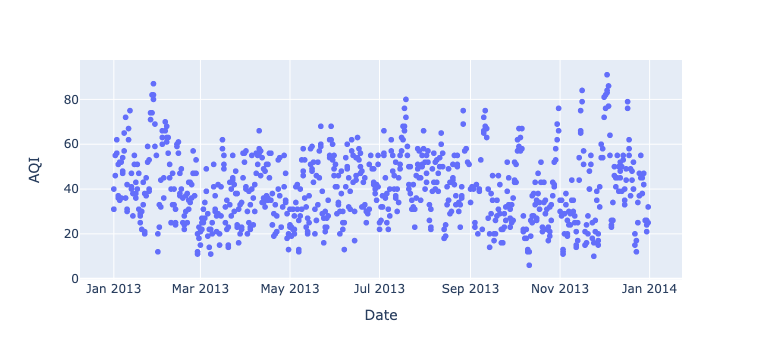

In [43]:
fig = px.scatter(Training,x='Date',y='AQI')
fig.show()

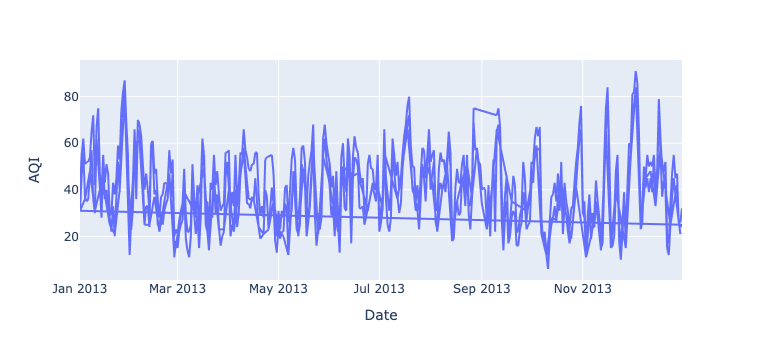

In [245]:
fig = px.line(Training,x='Date',y='AQI')
fig.show()

In [ ]:
# pio.write_image(fig, file = 'AQI2013.png', format = 'png')

## - Geospatial

In [ ]:
#Pollutants csv to geojson

# json_result_string = Pollut2013.to_json(
#     orient='records', 
#     double_precision=12,
#     date_format='iso'
# )
# json_result = json.loads(json_result_string)
# geojson = {
#     'type': 'FeatureCollection',
#     'features': []
# }
# for record in json_result:
#     geojson['features'].append({
#         'type': 'Feature',
#         'geometry': {
#             'type': 'Point',
#             'coordinates': [record['Longitude'], record['Latitude']],
#         },
#         'properties': record,
#     })
# with open('/Users/jadamacharie/Downloads/daily_PM_2013.json', 'w') as f:
#     f.write(json.dumps(geojson, indent=2))

In [44]:
# Load vector layer
Ward1_shapefile = gpd.read_file("Ward1")
# Ward1_shapefile

In [45]:
#Plot 
Ward1_shapefile.explore()

## Machine Learning

## - KNN (K-Nearest Neighbors) ML without Remote Sensing

In [148]:
final_df['AQI_Bucket'] = final_df['AQI_Bucket'].map({'Good' :0, 'Satisfactory' :1, 'Moderate' :2, 'Poor' :3, 'Very Poor' :4, 'Severe' :5}).astype(int)
final_df.head()
# final_df['y'] = final_df['y'].map({'Good' :0, 'Satisfactory' :1})

,AQI,AQI_Bucket
0,0.0,0
1,0.0,0
2,34.0,0
3,0.0,0
4,0.0,0


In [156]:
X = AQI_Bucket[['1st Max Value']]
y = AQI_Bucket[['AQI_Bucket']]

In [157]:
print(X.shape)
print(Y.shape)

(2066, 1)
(100,)


In [166]:
label_encoder = preprocessing.LabelEncoder()

Y=Y.astype('str')

Y= label_encoder.fit_transform(Y)

In [167]:
#split dataset
X_train,X_test,Y_train,y_test = train_test_split(X,y,random_state = 0, test_size = 0.20)
print(X_train.shape, X_test.shape, Y_train.shape, y_test.shape)

(1652, 1) (414, 1) (1652, 1) (414, 1)


In [168]:
#Feature Scaling
sc_X = StandardScaler()
sc_X.fit(X_train)
X_train = sc_X.transform(X_train)
X_test = sc_X.transform(X_test)

In [169]:
import math
math.sqrt(len(Y_test))

4.47213595499958

In [170]:
classifier = KNeighborsClassifier(n_neighbors = 5, p=1, metric='euclidean')

In [171]:
#convert y values to categorical values
lab = preprocessing.LabelEncoder()
y_transformed = lab.fit_transform(Y)
y_transformed

array([1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
       1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1])

In [173]:
#Fit Model
classifier.fit(X,y)

KNeighborsClassifier(metric='euclidean', p=1)

In [174]:
#Predict the test set results
y_pred = classifier.predict(X_test)

In [175]:
# #Evaluate Model
print('Accuracy Score:',accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy Score: 0.9492753623188406
              precision    recall  f1-score   support

        Good       0.95      1.00      0.97       393
Satisfactory       0.00      0.00      0.00        21

    accuracy                           0.95       414
   macro avg       0.47      0.50      0.49       414
weighted avg       0.90      0.95      0.92       414

[[393   0]
 [ 21   0]]


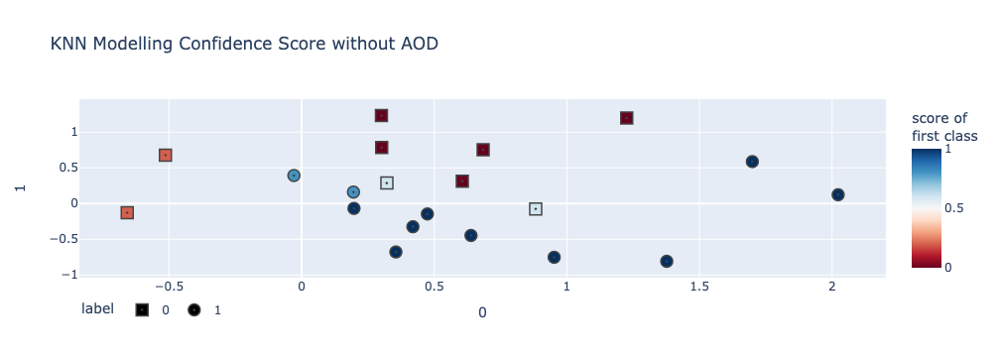

In [177]:
# Plot without remote sensing
#Plot
from sklearn.datasets import make_moons
# Load and split data
X, Y = make_moons(noise=0.3, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(
    X, Y.astype(str), test_size=0.20, random_state=0)

# Fit the model on training data, predict on test data
clf = KNeighborsClassifier(5)
clf.fit(X_train, Y_train)
y_score = clf.predict_proba(X_test)[:, 1]

fig = px.scatter(
    X_test, x=0, y=1,
    title = 'KNN Modelling Confidence Score without AOD',
    color=y_score, color_continuous_scale='RdBu',
    symbol=y_test, symbol_map={'0': 'square-dot', '1': 'circle-dot'},
    labels={'symbol': 'label', 'color': 'score of <br>first class'}
)
fig.update_traces(marker_size=12, marker_line_width=1.5)
fig.update_layout(legend_orientation='h')
fig.show()

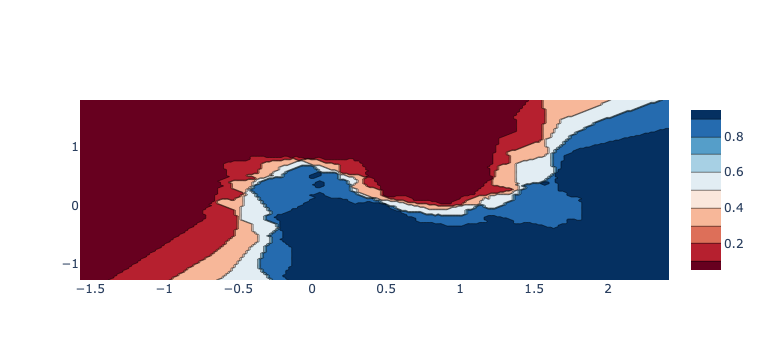

In [178]:

mesh_size = .02
margin = 0.25

# Load and split data
X, y = make_moons(noise=0.3, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=0)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(5, weights='uniform')
clf.fit(X, y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)


# Plot the figure
fig = go.Figure(data=[
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        colorscale='RdBu'
    )
])
fig.show()

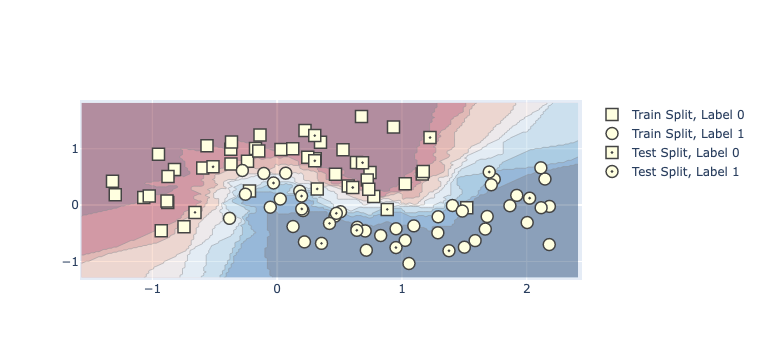

In [179]:
mesh_size = .02
margin = 0.25

# Load and split data
X, y = make_moons(noise=0.3, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=0)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(15, weights='uniform')
clf.fit(X, y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)

trace_specs = [
    [X_train, y_train, '0', 'Train', 'square'],
    [X_train, y_train, '1', 'Train', 'circle'],
    [X_test, y_test, '0', 'Test', 'square-dot'],
    [X_test, y_test, '1', 'Test', 'circle-dot']
]

fig = go.Figure(data=[
    go.Scatter(
        x=X[y==label, 0], y=X[y==label, 1],
        name=f'{split} Split, Label {label}',
        mode='markers', marker_symbol=marker
    )
    for X, y, label, split, marker in trace_specs
])
fig.update_traces(
    marker_size=12, marker_line_width=1.5,
    marker_color="lightyellow"
)

fig.add_trace(
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        showscale=False,
        colorscale='RdBu',
        opacity=0.4,
        name='Score',
        hoverinfo='skip'
    )
)
fig.show()

## - KNN (K-Nearest Neighbors) ML with Remote Sensing

In [180]:
final_df= AQI_Bucket[['AQI', 'AQI_Bucket','Aerosol Optical Depth']].copy()
final_df

,AQI,AQI_Bucket,Aerosol Optical Depth
0,0.0,Good,NaN
1,0.0,Good,NaN
2,34.0,Good,NaN
3,0.0,Good,NaN
4,0.0,Good,180.422
...,...,...,...
2061,0.0,Good,NaN
2062,28.5,Good,NaN
2063,0.0,Good,NaN
2064,0.0,Good,NaN


In [219]:
final_df['AQI_Bucket'] = final_df['AQI_Bucket'].map({'Good' :0, 'Satisfactory' :1, 'Moderate' :2, 'Poor' :3, 'Very Poor' :4, 'Severe' :5}).astype(int)
final_df.head()
# final_df['y'] = final_df['y'].map({'Good' :0, 'Satisfactory' :1})

,AQI,AQI_Bucket,Aerosol Optical Depth
0,0.0,0,NaN
1,0.0,0,NaN
2,34.0,0,NaN
3,0.0,0,NaN
4,0.0,0,180.422


In [220]:
X = AOD2013.iloc[:,[2,8]].values
X.shape

(2066, 2)

In [221]:
Y = AQI_Bucket[['AQI']]

In [222]:
# # #Splitting the dataset into Dependent and Independent
# AQI_Bucket.fillna(0,inplace=True)
# AQI_Bucket


In [223]:
print(X.shape)
print(Y.shape)

(2066, 2)
(2066, 1)


In [224]:
label_encoder = preprocessing.LabelEncoder()

Y=Y.astype('str')

Y= label_encoder.fit_transform(Y)

In [231]:
#split dataset
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,random_state = 0, test_size = 0.20)
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(1652, 2) (414, 2) (1652, 1) (414, 1)


In [232]:
classifier = KNeighborsClassifier(n_neighbors = 5, p=1, metric='euclidean')

In [233]:
#scale the data (feature scaling)
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


In [238]:
classifier.fit(X,y)

KNeighborsClassifier(metric='euclidean', p=1)

In [239]:
#Predict the test set results
y_pred = clf.predict(X_test)

In [240]:
#Evaluate Model
print('Accuracy Score:',accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
# print(confusion_matrix(Y_test, y_pred))

Accuracy Score: 0.11352657004830918
              precision    recall  f1-score   support

           0       0.94      0.14      0.24       336
           1       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         1
          10       0.00      0.00      0.00         1
          11       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         1
          20       0.00      0.00      0.00         2
          23       0.00      0.00      0.00         1
          27       0.00      0.00      0.00         1
          29       0.00      0.00      0.00         1
          32       0.00      0.00      0.00         1
          33       0.00      0.00      0.00         1
          34       0.00      0.00      0.00         1
          35       0.00      0.00      0.00         1
          36       0.00      0.00      0.00         1
          37       0.00      0.00      0.00         1
          43       0.00      0.00      0.00  

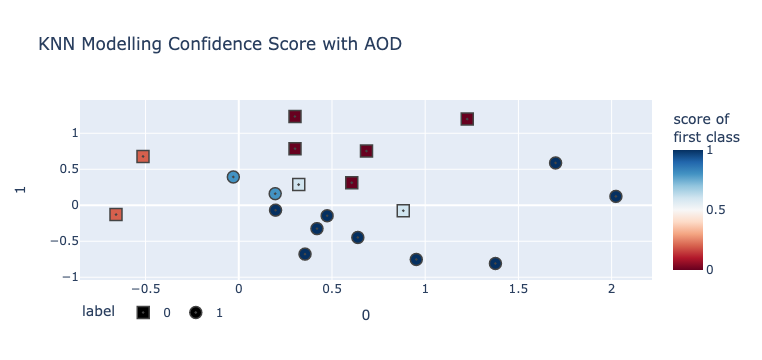

In [244]:
#Plot
# Load and split data
X, y = make_moons(noise=0.3, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=0)

# Fit the model on training data, predict on test data
clf = KNeighborsClassifier(5)
clf.fit(X_train, y_train)
Y_score = clf.predict_proba(X_test)[:, 1]

fig = px.scatter(
    X_test, x=0, y=1,
    title = 'KNN Modelling Confidence Score with AOD',
    color=y_score, color_continuous_scale='RdBu',
    symbol=y_test, symbol_map={'0': 'square-dot', '1': 'circle-dot'},
    labels={'symbol': 'label', 'color': 'score of <br>first class'}
)
fig.update_traces(marker_size=12, marker_line_width=1.5)
fig.update_layout(legend_orientation='h')
fig.show()

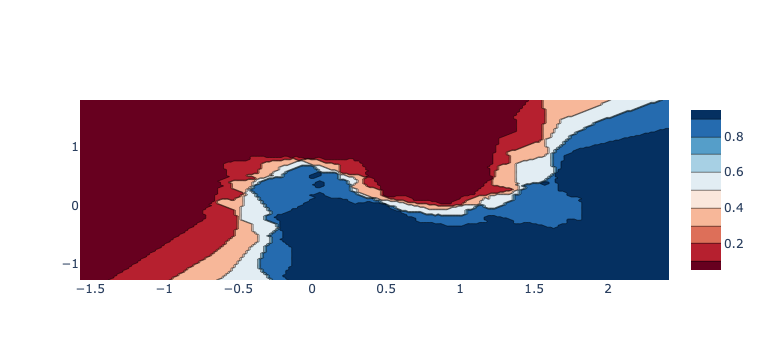

In [106]:
mesh_size = .02
margin = 0.25

# Load and split data
X, y = make_moons(noise=0.3, random_state=0)
X_train, X_test, y_train, y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=0)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(5, weights='uniform')
clf.fit(X, y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)


# Plot the figure
fig = go.Figure(data=[
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        colorscale='RdBu'
    )
])
fig.show()

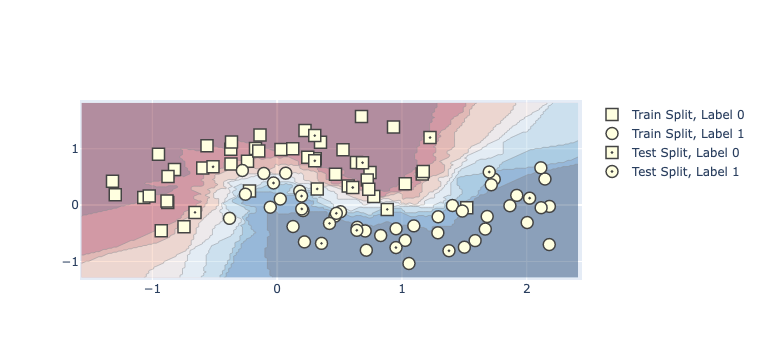

In [107]:
mesh_size = .02
margin = 0.25

# Load and split data
X, Y = make_moons(noise=0.3, random_state=0)
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y.astype(str), test_size=0.20, random_state=0)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(15, weights='uniform')
clf.fit(X, Y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)

trace_specs = [
    [X_train, y_train, '0', 'Train', 'square'],
    [X_train, y_train, '1', 'Train', 'circle'],
    [X_test, y_test, '0', 'Test', 'square-dot'],
    [X_test, y_test, '1', 'Test', 'circle-dot']
]

fig = go.Figure(data=[
    go.Scatter(
        x=X[y==label, 0], y=X[y==label, 1],
        name=f'{split} Split, Label {label}',
        mode='markers', marker_symbol=marker
    )
    for X, y, label, split, marker in trace_specs
])
fig.update_traces(
    marker_size=12, marker_line_width=1.5,
    marker_color="lightyellow"
)

fig.add_trace(
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        showscale=False,
        colorscale='RdBu',
        opacity=0.4,
        name='Score',
        hoverinfo='skip'
    )
)
fig.show()

## - RF (Random Forest) ML without Remote sensing

In [108]:
final_df= AQI_Bucket[['AQI', 'AQI_Bucket']].copy()
final_df

,AQI,AQI_Bucket
0,0.0,Good
1,0.0,Good
2,34.0,Good
3,0.0,Good
4,0.0,Good
...,...,...
2061,0.0,Good
2062,28.5,Good
2063,0.0,Good
2064,0.0,Good


In [109]:
final_df['AQI_Bucket'].unique()

array(['Good', 'Satisfactory', 'Moderate'], dtype=object)

In [110]:
final_df['AQI_Bucket'] = final_df['AQI_Bucket'].map({'Good' :0, 'Satisfactory' :1, 'Moderate' :2, 'Poor' :3, 'Very Poor' :4, 'Severe' :5}).astype(int)
final_df.head()
# final_df['y'] = final_df['y'].map({'Good' :0, 'Satisfactory' :1})


,AQI,AQI_Bucket
0,0.0,0
1,0.0,0
2,34.0,0
3,0.0,0
4,0.0,0


In [154]:
#Splitting the dataset into Dependent and Independent
#Independent and Dependent:
X = AQI_Bucket[['1st Max Value']]
y = AQI_Bucket[['AQI_Bucket']]

In [155]:
#split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0,test_size = 0.20)

In [113]:
#Fit Model
clf = RandomForestClassifier(random_state = 0).fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [114]:
#Evaluate Model
print('Accuracy Score:',accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy Score: 0.9782608695652174
              precision    recall  f1-score   support

        Good       0.98      0.99      0.99       393
Satisfactory       0.83      0.71      0.77        21

    accuracy                           0.98       414
   macro avg       0.91      0.85      0.88       414
weighted avg       0.98      0.98      0.98       414

[[390   3]
 [  6  15]]


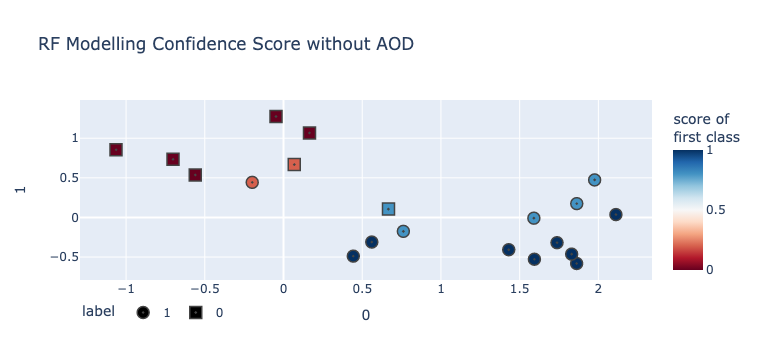

In [117]:
#Plot
from sklearn.datasets import make_moons
# Load and split data
X, y = make_moons(noise=0.3, random_state=70)
X_train, X_test, y_train, y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=70)

# Fit the model on training data, predict on test data
clf = KNeighborsClassifier(5)
clf.fit(X_train, y_train)
y_score = clf.predict_proba(X_test)[:, 1]

fig = px.scatter(
    X_test, x=0, y=1,
    title = 'RF Modelling Confidence Score without AOD',
    color=y_score, color_continuous_scale='RdBu',
    symbol=y_test, symbol_map={'0': 'square-dot', '1': 'circle-dot'},
    labels={'symbol': 'label', 'color': 'score of <br>first class'}
)
fig.update_traces(marker_size=12, marker_line_width=1.5)
fig.update_layout(legend_orientation='h')
fig.show()

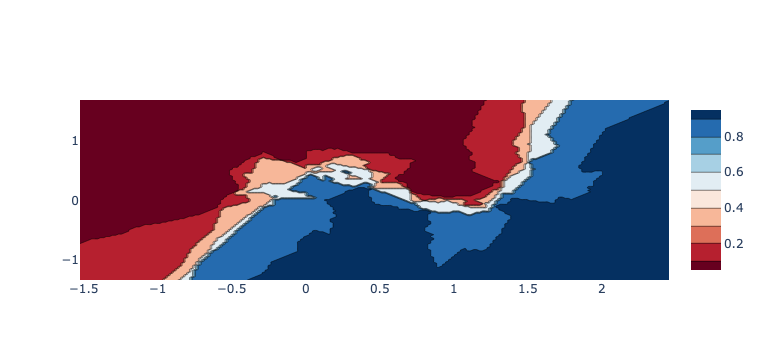

In [118]:
#Contour plot
import plotly.graph_objects as go
mesh_size = .02
margin = 0.25

# Load and split data
X, y = make_moons(noise=0.3, random_state=70)
X_train, X_test, y_train, y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=70)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(5, weights='uniform')
clf.fit(X, y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)


# Plot the figure
fig = go.Figure(data=[
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        colorscale='RdBu'
    )
])
fig.show()

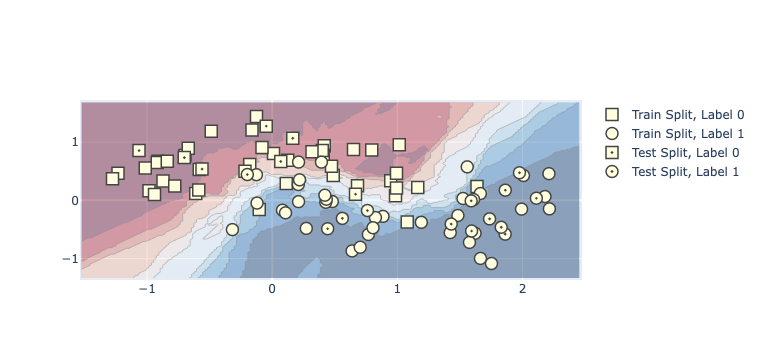

In [119]:
mesh_size = .02
margin = 0.25

# Load and split data
X, y = make_moons(noise=0.3, random_state=70)
X_train, X_test, y_train, y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=70)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(15, weights='uniform')
clf.fit(X, y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)

trace_specs = [
    [X_train, y_train, '0', 'Train', 'square'],
    [X_train, y_train, '1', 'Train', 'circle'],
    [X_test, y_test, '0', 'Test', 'square-dot'],
    [X_test, y_test, '1', 'Test', 'circle-dot']
]

fig = go.Figure(data=[
    go.Scatter(
        x=X[y==label, 0], y=X[y==label, 1],
        name=f'{split} Split, Label {label}',
        mode='markers', marker_symbol=marker
    )
    for X, y, label, split, marker in trace_specs
])
fig.update_traces(
    marker_size=12, marker_line_width=1.5,
    marker_color="lightyellow"
)

fig.add_trace(
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        showscale=False,
        colorscale='RdBu',
        opacity=0.4,
        name='Score',
        hoverinfo='skip'
    )
)
fig.show()

## - RF (Random Forest) ML with Remote sensing

In [128]:
final_df= AQI_Bucket[['AQI', 'AQI_Bucket','Aerosol Optical Depth']].copy()
final_df

,AQI,AQI_Bucket,Aerosol Optical Depth
0,0.0,Good,NaN
1,0.0,Good,NaN
2,34.0,Good,NaN
3,0.0,Good,NaN
4,0.0,Good,180.422
...,...,...,...
2061,0.0,Good,NaN
2062,28.5,Good,NaN
2063,0.0,Good,NaN
2064,0.0,Good,NaN


In [129]:
X = AOD2013.iloc[:,[2,8]].values
X.shape

(2066, 2)

In [218]:
Y = AQI_Bucket[['AQI']]

In [131]:
label_encoder = preprocessing.LabelEncoder()

Y=Y.astype('str')

Y= label_encoder.fit_transform(Y)

In [132]:
#split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0,test_size = 0.20)

In [133]:
#Fit Model
clf = RandomForestClassifier(random_state = 0).fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [134]:
#Evaluate Model
print('Accuracy Score:',accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

Accuracy Score: 1.0
              precision    recall  f1-score   support

        Good       1.00      1.00      1.00       393
Satisfactory       1.00      1.00      1.00        21

    accuracy                           1.00       414
   macro avg       1.00      1.00      1.00       414
weighted avg       1.00      1.00      1.00       414

[[393   0]
 [  0  21]]


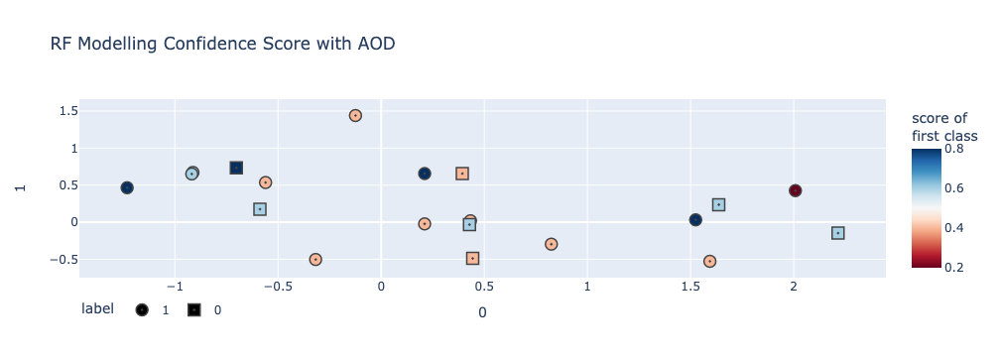

In [137]:
#Plot
# Load and split data
X, y = make_moons(noise=0.3, random_state=70)
X_train, X_test, Y_train, Y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=0)

# Fit the model on training data, predict on test data
clf = KNeighborsClassifier(5)
clf.fit(X_train, y_train)
y_score = clf.predict_proba(X_test)[:, 1]

fig = px.scatter(
    X_test, x=0, y=1,
    title = 'RF Modelling Confidence Score with AOD',
    color=y_score, color_continuous_scale='RdBu',
    symbol=y_test, symbol_map={'0': 'square-dot', '1': 'circle-dot'},
    labels={'symbol': 'label', 'color': 'score of <br>first class'}
)
fig.update_traces(marker_size=12, marker_line_width=1.5)
fig.update_layout(legend_orientation='h')
fig.show()

In [145]:
mesh_size = .02
margin = 0.25

# Load and split data
X, y = make_moons(noise=0.3, random_state=70)
X_train, X_test, Y_train, Y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=0)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(5, weights='uniform')
clf.fit(X, y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)


# Plot the figure
fig = go.Figure(data=[
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        colorscale='RdBu'
    )
])

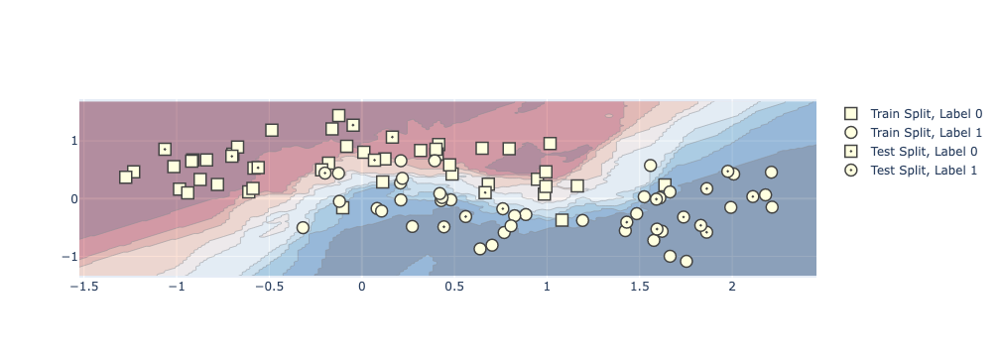

In [144]:
mesh_size = .02
margin = 0.25

# Load and split data
X, y = make_moons(noise=0.3, random_state=70)
X_train, X_test, Y_train, Y_test = train_test_split(
    X, y.astype(str), test_size=0.20, random_state=70)

# Create a mesh grid on which we will run our model
x_min, x_max = X[:, 0].min() - margin, X[:, 0].max() + margin
y_min, y_max = X[:, 1].min() - margin, X[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Create classifier, run predictions on grid
clf = KNeighborsClassifier(15, weights='uniform')
clf.fit(X, y)
Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)

trace_specs = [
    [X_train, Y_train, '0', 'Train', 'square'],
    [X_train, Y_train, '1', 'Train', 'circle'],
    [X_test, Y_test, '0', 'Test', 'square-dot'],
    [X_test, Y_test, '1', 'Test', 'circle-dot']
]

fig = go.Figure(data=[
    go.Scatter(
        x=X[y==label, 0], y=X[y==label, 1],
        name=f'{split} Split, Label {label}',
        mode='markers', marker_symbol=marker
    )
    for X, y, label, split, marker in trace_specs
])
fig.update_traces(
    marker_size=12, marker_line_width=1.5,
    marker_color="lightyellow"
)

fig.add_trace(
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        showscale=False,
        colorscale='RdBu',
        opacity=0.4,
        name='Score',
        hoverinfo='skip'
    )
)
fig.show()